<a href="https://colab.research.google.com/github/Marce-zyzz/Challenge-Alura-Store/blob/main/AluraStoreLatam_Marcelo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Importación de datos



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
pd.options.display.float_format = '{:,.0f}'.format

url = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_1%20.csv"
url2 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_2.csv"
url3 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_3.csv"
url4 = "https://raw.githubusercontent.com/alura-es-cursos/challenge1-data-science-latam/refs/heads/main/base-de-datos-challenge1-latam/tienda_4.csv"

tienda = pd.read_csv(url)
tienda2 = pd.read_csv(url2)
tienda3 = pd.read_csv(url3)
tienda4 = pd.read_csv(url4)

tiendas = {
    'tienda': tienda,
    'tienda2': tienda2,
    'tienda3': tienda3,
    'tienda4': tienda4
}


tienda.head()

,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon
0,Asistente virtual,Electrónicos,"164,300","6,900",16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,5,-74
1,Mesa de comedor,Muebles,"192,300","8,400",18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6,-76
2,Juego de mesa,Juguetes,"209,600","15,900",15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10,-76
3,Microondas,Electrodomésticos,"757,500","41,000",03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3,-77
4,Silla de oficina,Muebles,"335,200","20,200",07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6,-76


#1. Análisis de facturación



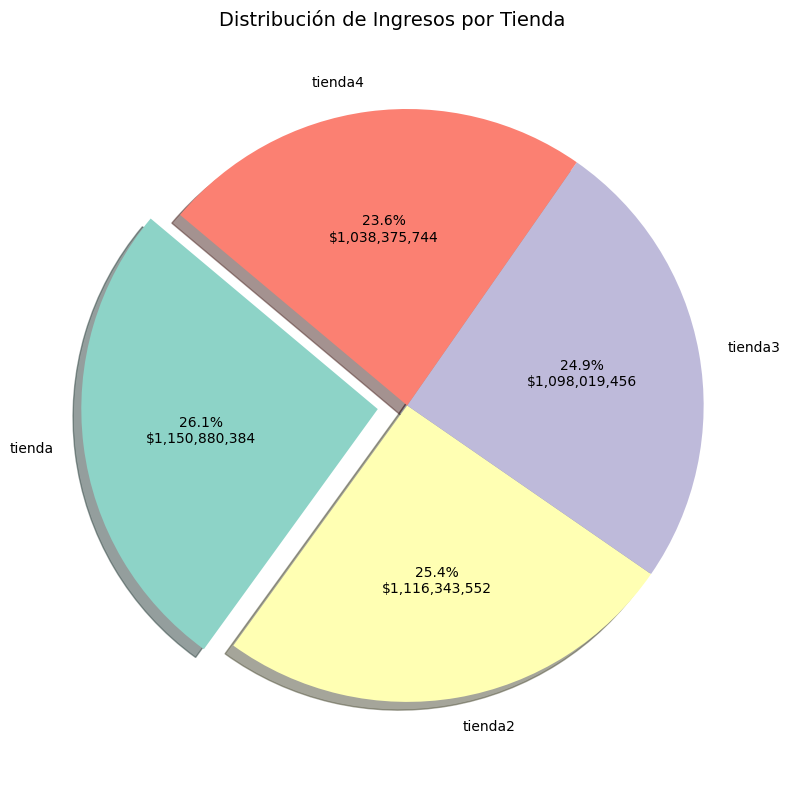

In [ ]:
# Calcular ingresos por tienda
ingresos = {nombre: df['Precio'].sum() for nombre, df in tiendas.items()}
ingresos_df = pd.DataFrame(list(ingresos.items()), columns=['Tienda', 'Ingreso Total (COP)'])

# Ordenar por ingreso de mayor a menor
ingresos_df = ingresos_df.sort_values(by='Ingreso Total (COP)', ascending=False).reset_index(drop=True)

# Configurar colores y explosión
colors = plt.cm.Set3(range(len(ingresos_df)))
explode = [0.1 if i == 0 else 0 for i in range(len(ingresos_df))]  # destacar la tienda con más ingresos

# Función para mostrar porcentaje y valor
def autopct_func(pct, allvals):
    total = sum(allvals)
    valor = int(pct/100. * total)
    return f'{pct:.1f}%\n${valor:,.0f}'

# Crear gráfico pastel
plt.figure(figsize=(8, 8))
plt.pie(
    ingresos_df['Ingreso Total (COP)'],
    labels=ingresos_df['Tienda'],
    autopct=lambda pct: autopct_func(pct, ingresos_df['Ingreso Total (COP)']),
    startangle=140,
    colors=colors,
    explode=explode,
    shadow=True
)
plt.title('Distribución de Ingresos por Tienda', fontsize=14)
plt.axis('equal')
plt.tight_layout()
plt.show()


# 2. Ventas por categoría

In [ ]:
# Agrupar ventas por categoría por tienda
ventas_cat = {nombre: df['Categoría del Producto'].value_counts() for nombre, df in tiendas.items()}
ventas_cat_df = pd.DataFrame(ventas_cat).fillna(0)


=== Porcentaje de Ventas por Categoría por Tienda ===


,tienda,tienda2,tienda3,tienda4
Categoría del Producto,,,,
Artículos para el hogar,23,25,24,28
Deportes y diversión,26,25,25,25
Electrodomésticos,27,27,24,22
Electrónicos,25,24,25,25
Instrumentos musicales,24,30,24,23
Juguetes,25,24,24,26
Libros,23,27,25,25
Muebles,25,23,26,25


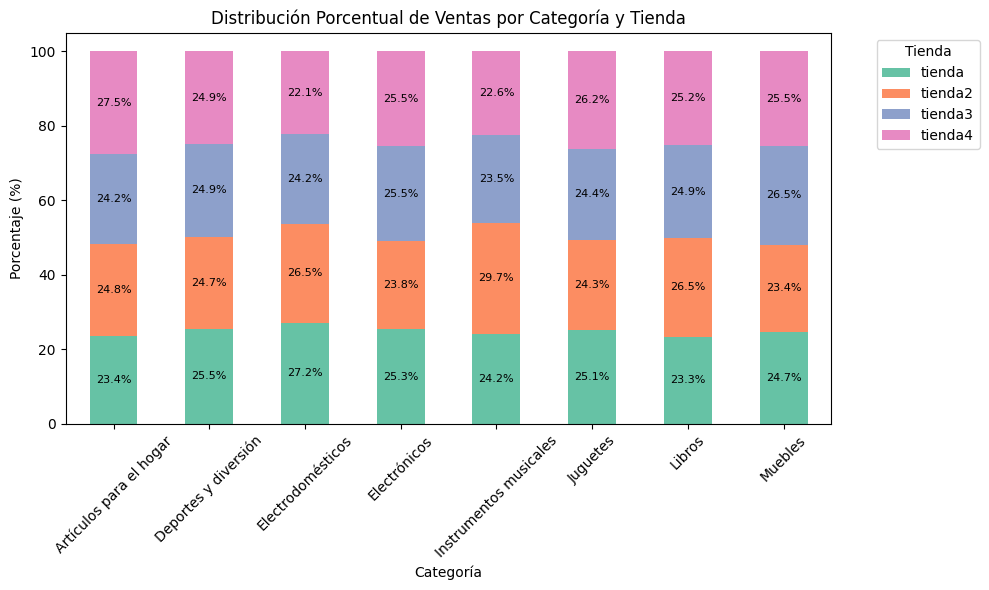

In [ ]:
# Calcular porcentajes por fila (por categoría)
ventas_pct_df = ventas_cat_df.div(ventas_cat_df.sum(axis=1), axis=0) * 100

print("\n=== Porcentaje de Ventas por Categoría por Tienda ===")
display(ventas_pct_df.round(2))

# Colores personalizados para cada tienda (puedes ajustarlos)
colors = plt.cm.Set2.colors  # o usa plt.get_cmap('tab10')

# Crear gráfico de barras apiladas con porcentajes
ax = ventas_pct_df.plot(kind='bar', stacked=True, figsize=(10, 6), color=colors)

plt.title('Distribución Porcentual de Ventas por Categoría y Tienda')
plt.xlabel('Categoría')
plt.ylabel('Porcentaje (%)')
plt.xticks(rotation=45)
plt.legend(title='Tienda', bbox_to_anchor=(1.05, 1), loc='upper left')

# Agregar valores (porcentajes) encima de cada segmento de barra
for i, categoria in enumerate(ventas_pct_df.index):
    y_offset = 0
    for tienda in ventas_pct_df.columns:
        valor = ventas_pct_df.loc[categoria, tienda]
        if valor > 3:
            ax.text(i, y_offset + valor/2, f'{valor:.1f}%', ha='center', va='center', fontsize=8, color='black')
        y_offset += valor

plt.tight_layout()
plt.show()

# 3. Calificación promedio de la tienda


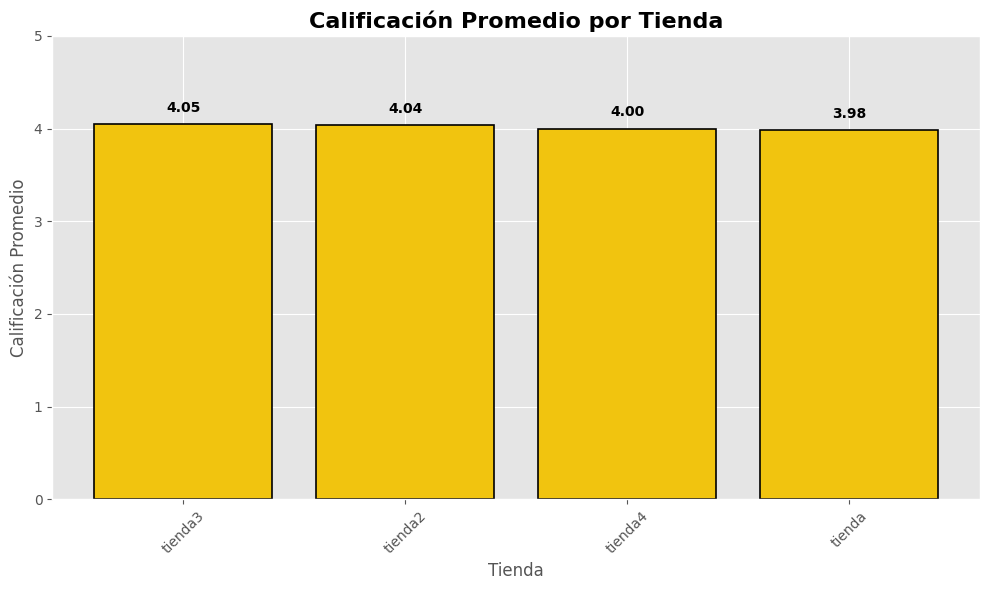

In [ ]:

# Calificación promedio por tienda
calif = {nombre: df['Calificación'].mean() for nombre, df in tiendas.items()}
calif_df = pd.DataFrame(list(calif.items()), columns=['Tienda', 'Calificación Promedio'])
calif_df['Calificación Promedio'] = calif_df['Calificación Promedio'].round(2)

# Ordenar de mayor a menor
calif_df = calif_df.sort_values(by='Calificación Promedio', ascending=False).reset_index(drop=True)

# Colores según calificación
colores = calif_df['Calificación Promedio'].apply(
    lambda x: '#2ecc71' if x >= 4.5 else ('#f1c40f' if x >= 3.5 else '#e74c3c')
)

# Estilo opcional
plt.style.use('ggplot')

# Gráfico
plt.figure(figsize=(10,6))
bars = plt.bar(
    calif_df['Tienda'],
    calif_df['Calificación Promedio'],
    color=colores,
    edgecolor='black',
    linewidth=1.2
)

plt.title('Calificación Promedio por Tienda', fontsize=16, fontweight='bold')
plt.xlabel('Tienda')
plt.ylabel('Calificación Promedio')
plt.ylim(0, 5)
plt.xticks(rotation=45)

# Mostrar valores sobre las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(
        bar.get_x() + bar.get_width() / 2,
        yval + 0.1,
        f"{yval:.2f}",
        ha='center',
        va='bottom',
        fontsize=10,
        fontweight='bold'
    )

plt.tight_layout()
plt.show()

# 4. Productos más y menos vendidos


Top 5  


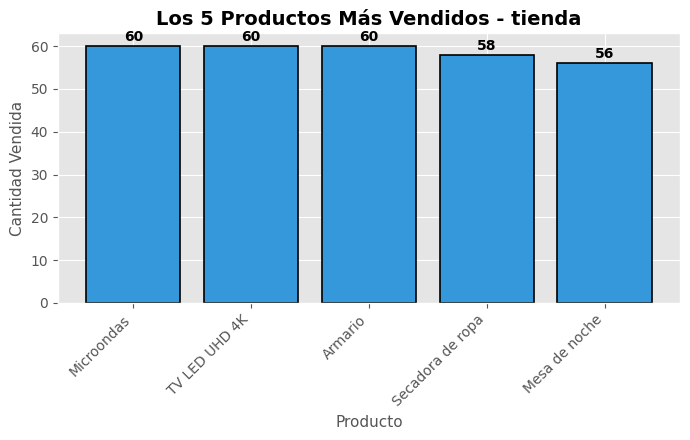

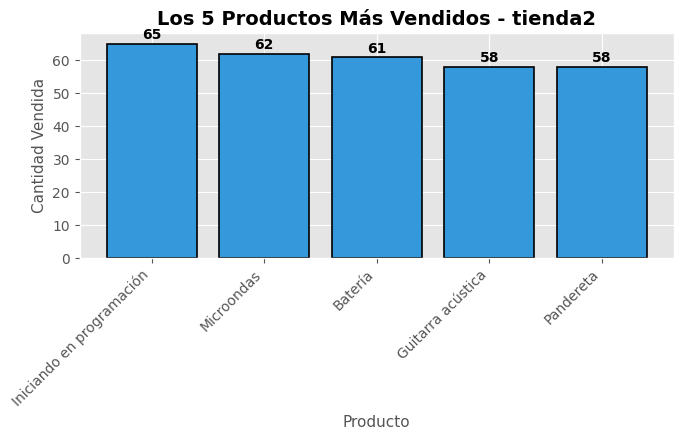

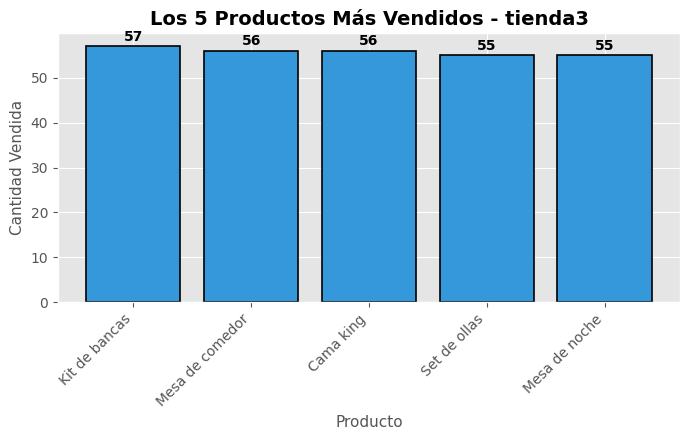

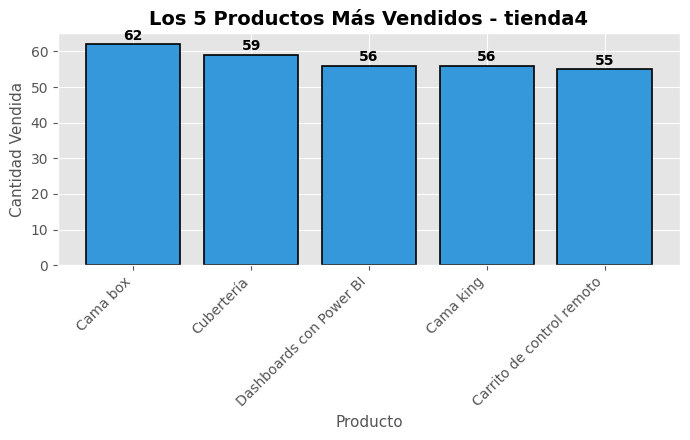

In [ ]:
print("\nTop 5  ")

top5 = {}
for nombre, df in tiendas.items():
    top5[nombre] = df['Producto'].value_counts().head(5)

    # Datos
    productos = top5[nombre].index
    ventas = top5[nombre].values

    # Gráfico
    plt.figure(figsize=(7,4.5))
    bars = plt.bar(productos, ventas, color='#3498db', edgecolor='black', linewidth=1.2)

    # Títulos y etiquetas
    plt.title(f'Los 5 Productos Más Vendidos - {nombre}', fontsize=14, fontweight='bold')
    plt.xlabel('Producto', fontsize=11)
    plt.ylabel('Cantidad Vendida', fontsize=11)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)

    # Mostrar valores sobre cada barra
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            height + 0.5,
            f'{int(height)}',
            ha='center',
            va='bottom',
            fontsize=10,
            fontweight='bold'
        )

    plt.tight_layout()
    plt.show()


 Top 5  


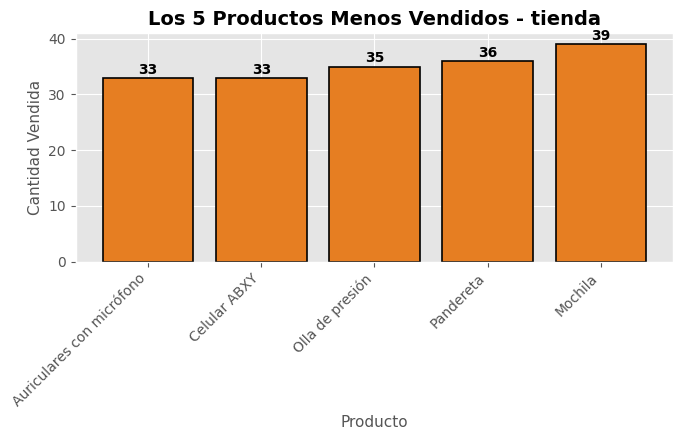

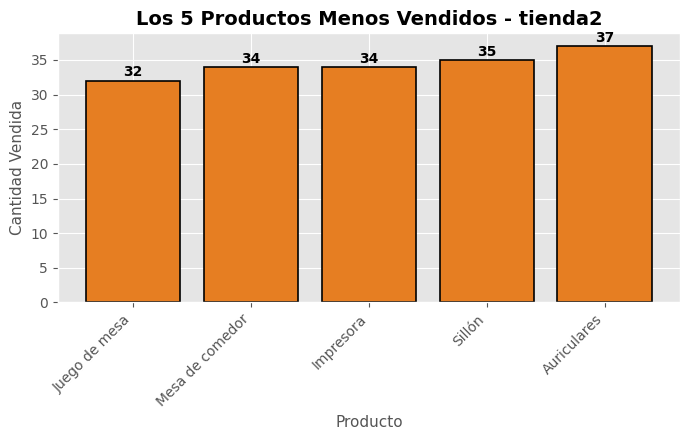

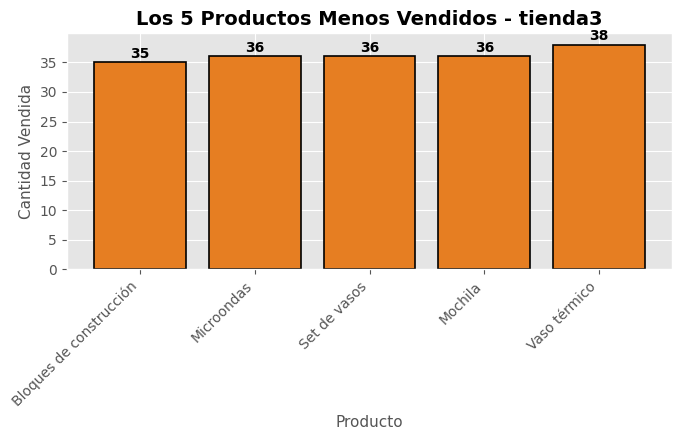

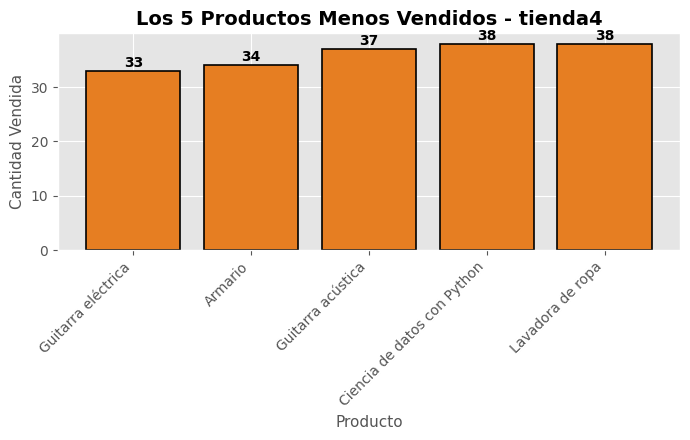

In [ ]:
print("\n Top 5  ")

bottom5 = {}
for nombre, df in tiendas.items():
    bottom5[nombre] = df['Producto'].value_counts().sort_values().head(5)

    # Datos
    productos = bottom5[nombre].index
    ventas = bottom5[nombre].values

    # Gráfico
    plt.figure(figsize=(7,4.5))
    bars = plt.bar(productos, ventas, color='#e67e22', edgecolor='black', linewidth=1.2)

    # Título y etiquetas
    plt.title(f'Los 5 Productos Menos Vendidos - {nombre}', fontsize=14, fontweight='bold')
    plt.xlabel('Producto', fontsize=11)
    plt.ylabel('Cantidad Vendida', fontsize=11)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)

    # Mostrar valores arriba de cada barra
    for bar in bars:
        height = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            height + 0.2,
            f'{int(height)}',
            ha='center',
            va='bottom',
            fontsize=10,
            fontweight='bold'
        )

    plt.tight_layout()
    plt.show()

## 5. Envío promedio por tienda

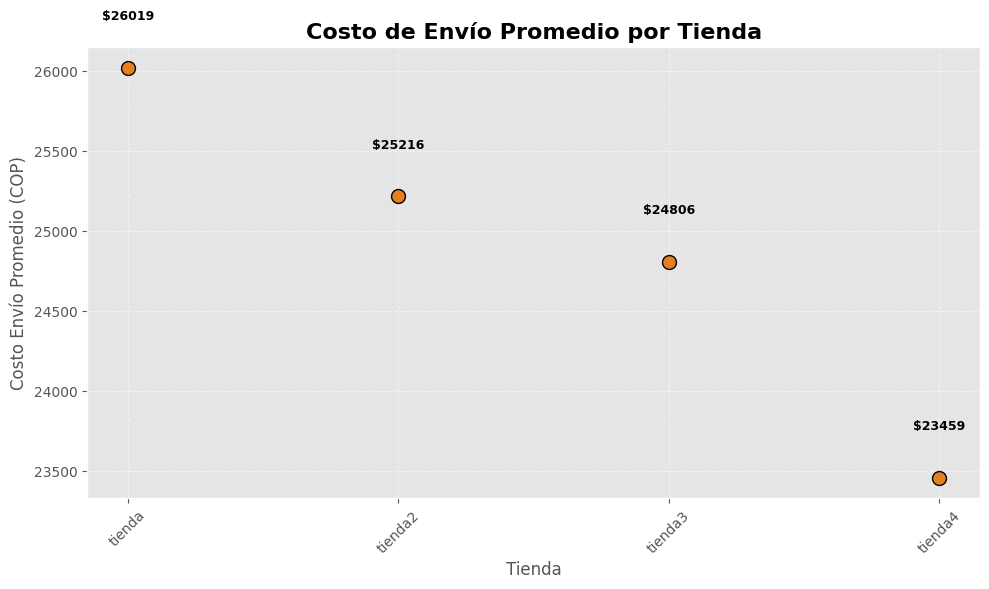

In [ ]:

# Calcular el promedio del costo de envío
envio_promedio = {nombre: df['Costo de envío'].mean() for nombre, df in tiendas.items()}
envio_prom_df = pd.DataFrame(list(envio_promedio.items()), columns=['Tienda', 'Costo Envío Promedio (COP)'])
envio_prom_df['Costo Envío Promedio (COP)'] = envio_prom_df['Costo Envío Promedio (COP)'].round(2)

# Ordenar para mejor visual
envio_prom_df = envio_prom_df.sort_values(by='Costo Envío Promedio (COP)', ascending=False).reset_index(drop=True)

# Gráfico de puntos
plt.figure(figsize=(10,6))
plt.scatter(
    envio_prom_df['Tienda'],
    envio_prom_df['Costo Envío Promedio (COP)'],
    color='#e67e22',
    s=100,
    edgecolor='black',
    linewidth=1
)

# Títulos y etiquetas
plt.title('Costo de Envío Promedio por Tienda', fontsize=16, fontweight='bold')
plt.xlabel('Tienda', fontsize=12)
plt.ylabel('Costo Envío Promedio (COP)', fontsize=12)
plt.xticks(rotation=45, fontsize=10)
plt.yticks(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.5)

# Etiquetas sobre los puntos
for i, row in envio_prom_df.iterrows():
    plt.text(
        row['Tienda'],
        row['Costo Envío Promedio (COP)'] + 300,
        f"${row['Costo Envío Promedio (COP)']:.0f}",
        ha='center',
        fontsize=9,
        fontweight='bold'
    )

plt.tight_layout()
plt.show()

# **6. Analisis del desempeño geografico**

In [ ]:
# Combinar todos los DataFrames de tiendas en uno solo, agregando una columna de tienda
df_geo = pd.concat(
    [df.copy().assign(Tienda=nombre) for nombre, df in tiendas.items()],
    ignore_index=True
)

# Mostrar las primeras filas para confirmar
print("\n=== DataFrame Unificado ===")
display(df_geo.head())


=== DataFrame Unificado ===


,Producto,Categoría del Producto,Precio,Costo de envío,Fecha de Compra,Vendedor,Lugar de Compra,Calificación,Método de pago,Cantidad de cuotas,lat,lon,Tienda
0,Asistente virtual,Electrónicos,"164,300","6,900",16/01/2021,Pedro Gomez,Bogotá,4,Tarjeta de crédito,8,5,-74,tienda
1,Mesa de comedor,Muebles,"192,300","8,400",18/05/2022,Beatriz Morales,Medellín,1,Tarjeta de crédito,4,6,-76,tienda
2,Juego de mesa,Juguetes,"209,600","15,900",15/03/2021,Juan Fernandez,Cartagena,1,Tarjeta de crédito,1,10,-76,tienda
3,Microondas,Electrodomésticos,"757,500","41,000",03/05/2022,Juan Fernandez,Cali,4,Nequi,1,3,-77,tienda
4,Silla de oficina,Muebles,"335,200","20,200",07/11/2020,Maria Alfonso,Medellín,5,Nequi,1,6,-76,tienda


In [ ]:
import folium
from folium.plugins import MarkerCluster

# Crear el mapa base centrado en el promedio de coordenadas
map_center = [df_geo['lat'].mean(), df_geo['lon'].mean()]
mapa = folium.Map(location=map_center, zoom_start=6)

# Agrupador de marcadores
marker_cluster = MarkerCluster().add_to(mapa)

# Agregar puntos al mapa
for _, fila in df_geo.iterrows():
    popup_text = f"""
    <strong>Tienda:</strong> {fila['Tienda']}<br>
    <strong>Producto:</strong> {fila.get('Producto', 'N/A')}<br>
    <strong>Ciudad:</strong> {fila.get('Ciudad', 'N/A')}<br>
    <strong>Ventas:</strong> {fila.get('Precio', 'N/A')} COP
    """
    folium.CircleMarker(
        location=[fila['lat'], fila['lon']],
        radius=6,
        color='blue',
        fill=True,
        fill_color='orange',
        fill_opacity=0.7,
        popup=folium.Popup(popup_text, max_width=300)
    ).add_to(marker_cluster)

# Mostrar mapa
mapa

In [ ]:
import folium
from folium.plugins import HeatMap

# Crear mapa base
mapa = folium.Map(location=[df_geo['lat'].mean(), df_geo['lon'].mean()], zoom_start=6)

# Preparar datos (lista de [lat, lon])
heat_data = df_geo[['lat', 'lon']].dropna().values.tolist()

# Agregar capa de calor
HeatMap(heat_data, radius=12, blur=15, max_zoom=10).add_to(mapa)

# Mostrar mapa
mapa